In [1]:
import pandas as pd
import numpy as np 

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('seaborn-v0_8')

import librosa

In [3]:

matplotlib.__version__

'3.7.0'

# Load Data

In [2]:
df_voice = pd.read_csv('./df_voice.csv')

df_voice.head()

,path,type_split,intent_class
0,C:\Users\LENOVO YOGA\.cache\huggingface\datase...,train,13
1,C:\Users\LENOVO YOGA\.cache\huggingface\datase...,train,4
2,C:\Users\LENOVO YOGA\.cache\huggingface\datase...,train,1
3,C:\Users\LENOVO YOGA\.cache\huggingface\datase...,train,4
4,C:\Users\LENOVO YOGA\.cache\huggingface\datase...,train,1


# Check Data Info

In [4]:
df_voice.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8168 entries, 0 to 8167
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   path          8168 non-null   object
 1   type_split    8168 non-null   object
 2   intent_class  8168 non-null   int64 
dtypes: int64(1), object(2)
memory usage: 191.6+ KB


# Check the Amount of Data For Each Class in the intent_class Column

## All Data

In [5]:
class_counts_all = df_voice['intent_class'].value_counts(ascending=False)

class_counts_all

intent_class
0     654
1     627
7     608
6     601
4     598
11    596
3     596
5     580
13    577
12    562
9     562
8     551
10    549
2     507
Name: count, dtype: int64

## Data Train

In [6]:
class_counts_train = df_voice['intent_class'][df_voice['type_split'] == 'train'].value_counts(ascending=False)

class_counts_train

intent_class
0     521
1     501
3     489
6     489
4     482
11    479
7     478
5     463
13    461
12    444
9     443
8     441
10    431
2     412
Name: count, dtype: int64

## Data Test

In [7]:
class_counts_test = df_voice['intent_class'][df_voice['type_split'] == 'test'].value_counts(ascending=False)

class_counts_test

intent_class
0     133
7     130
1     126
9     119
10    118
12    118
5     117
11    117
4     116
13    116
6     112
8     110
3     107
2      95
Name: count, dtype: int64

## Replace the index value with a string

In [8]:
# Mengganti angka dengan kata sesuai dengan syarat yang diberikan
class_mapping = {
    0: 'abroad',
    1: 'address',
    2: 'app_error',
    3: 'atm_limit',
    4: 'balance',
    5: 'business_loan',
    6: 'card_issues',
    7: 'cash_deposit',
    8: 'direct_debit',
    9: 'freeze',
    10: 'high_value_payment',
    11: 'joint_account',
    12: 'latest_transactions',
    13: 'pay_bill'
}

# Mengganti indeks DataFrame dengan kata-kata menggunakan class_mapping
class_counts_all.index = class_counts_all.index.map(class_mapping)
class_counts_train.index = class_counts_train.index.map(class_mapping)
class_counts_test.index = class_counts_test.index.map(class_mapping)

## Display the Diagram

C:\Users\LENOVO YOGA\AppData\Local\Temp\ipykernel_19476\2276216490.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=counts.values, y=counts.index, palette='rocket', ax=ax)
C:\Users\LENOVO YOGA\AppData\Local\Temp\ipykernel_19476\2276216490.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=counts.values, y=counts.index, palette='rocket', ax=ax)
C:\Users\LENOVO YOGA\AppData\Local\Temp\ipykernel_19476\2276216490.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=counts.values, y=counts.index, palette='rocket', ax=ax)


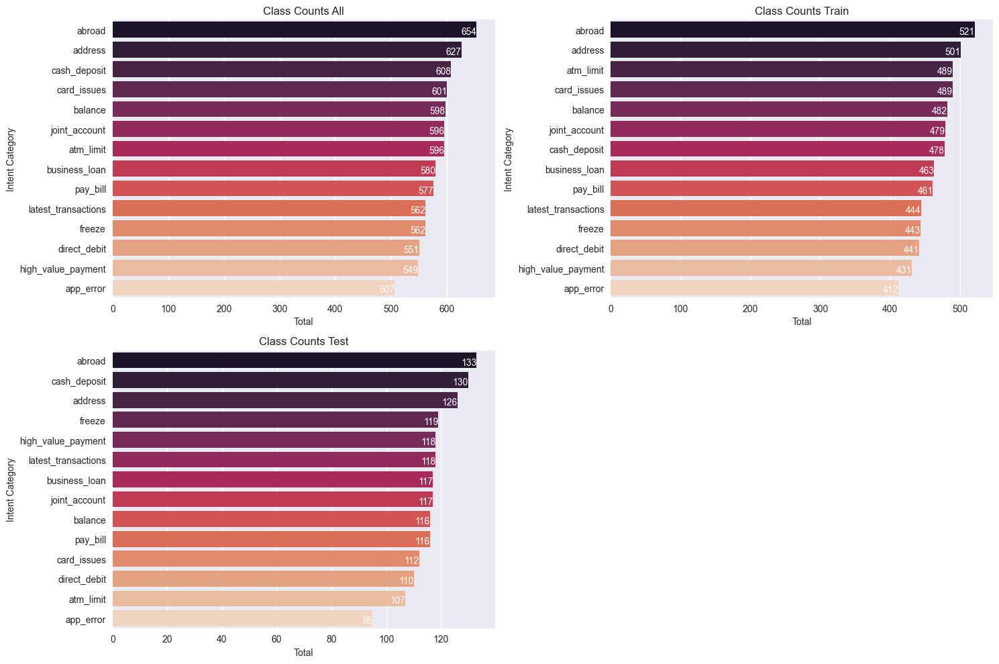

In [9]:
import matplotlib.pyplot as plt
import seaborn as sns

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(15, 10))

# Data and titles
data = [class_counts_all, class_counts_train, class_counts_test]
titles = ['Class Counts All', 'Class Counts Train', 'Class Counts Test']

for i, (ax, counts, title) in enumerate(zip(axes.flatten()[:-1], data, titles)):
    sns.barplot(x=counts.values, y=counts.index, palette='rocket', ax=ax)
    ax.set_title(title)
    ax.set_xlabel('Total')
    ax.set_ylabel('Intent Category')

    # Annotate each bar
    for p in ax.patches:
        ax.annotate(f'{int(p.get_width())}', (p.get_x() + p.get_width(), p.get_y() + 0.5), ha='right', va='center', color='white') 

# Hide the empty subplot in the last row and last column
axes[1, 1].axis('off')

# Adjust layout for better spacing
plt.tight_layout()

# Show the plots
plt.show()


# Displays the Signal Graph of each intent_class

In [10]:
from IPython.display import Audio
import torchaudio
import torch

In [11]:
selected_samples = {}

unique_intent_classes = np.unique(df_voice['intent_class'])
unique_intent_classes

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13],
      dtype=int64)

## Each intent_class category will take 1 data

Data retrieval is done by looking for index 1 for each intent_class

- intent_class 0 is at index 5
- intent_class 1 is at index 2
- intent_class 2 is at index 59
- intent_class 3 is at index 20
- intent_class 4 is at index 1
- intent_class 5 is at index 42
- intent_class 6 is at index 33
- intent_class 7 is at index 9
- intent_class 8 is at index 6
- intent_class 9 is at index 29
- intent_class 10 is at index 15
- intent_class 11 is at index 8
- intent_class 12 is at index 12
- intent_class 13 is at index 0

In [34]:
for intent_class in unique_intent_classes:

    index = np.where(np.array(df_voice['intent_class']) == intent_class)[0][0]

    print(index)
    
    selected_samples[intent_class] = {
        'path': df_voice['path'].iloc[index],
    }

print(selected_samples)

5
2
59
20
1
42
33
9
6
29
15
8
12
0
{0: {'path': 'C:\\Users\\LENOVO YOGA\\.cache\\huggingface\\datasets\\downloads\\extracted\\6192286b79dd83fd3995c7d1b9d4ac6dbda4d70ca9ac90c911338036b7a60344\\pt-PT~ABROAD\\CA27c7b9131e415a6ba8429cdee85efb07_1.wav'}, 1: {'path': 'C:\\Users\\LENOVO YOGA\\.cache\\huggingface\\datasets\\downloads\\extracted\\6192286b79dd83fd3995c7d1b9d4ac6dbda4d70ca9ac90c911338036b7a60344\\it-IT~ADDRESS\\CA6d435866f94097854802804e1060efa7_0.wav'}, 2: {'path': 'C:\\Users\\LENOVO YOGA\\.cache\\huggingface\\datasets\\downloads\\extracted\\6192286b79dd83fd3995c7d1b9d4ac6dbda4d70ca9ac90c911338036b7a60344\\ru-RU~APP_ERROR\\60300807963e11ccd901e608.wav'}, 3: {'path': 'C:\\Users\\LENOVO YOGA\\.cache\\huggingface\\datasets\\downloads\\extracted\\6192286b79dd83fd3995c7d1b9d4ac6dbda4d70ca9ac90c911338036b7a60344\\cs-CZ~ATM_LIMIT\\response_6.wav'}, 4: {'path': 'C:\\Users\\LENOVO YOGA\\.cache\\huggingface\\datasets\\downloads\\extracted\\6192286b79dd83fd3995c7d1b9d4ac6dbda4d70ca9ac90c91

In [30]:
class_mapping = {
    0: 'abroad',
    1: 'address',
    2: 'app_error',
    3: 'atm_limit',
    4: 'balance',
    5: 'business_loan',
    6: 'card_issues',
    7: 'cash_deposit',
    8: 'direct_debit',
    9: 'freeze',
    10: 'high_value_payment',
    11: 'joint_account',
    12: 'latest_transactions',
    13: 'pay_bill'
}

## Displays a Waveform Diagram for each intent_class

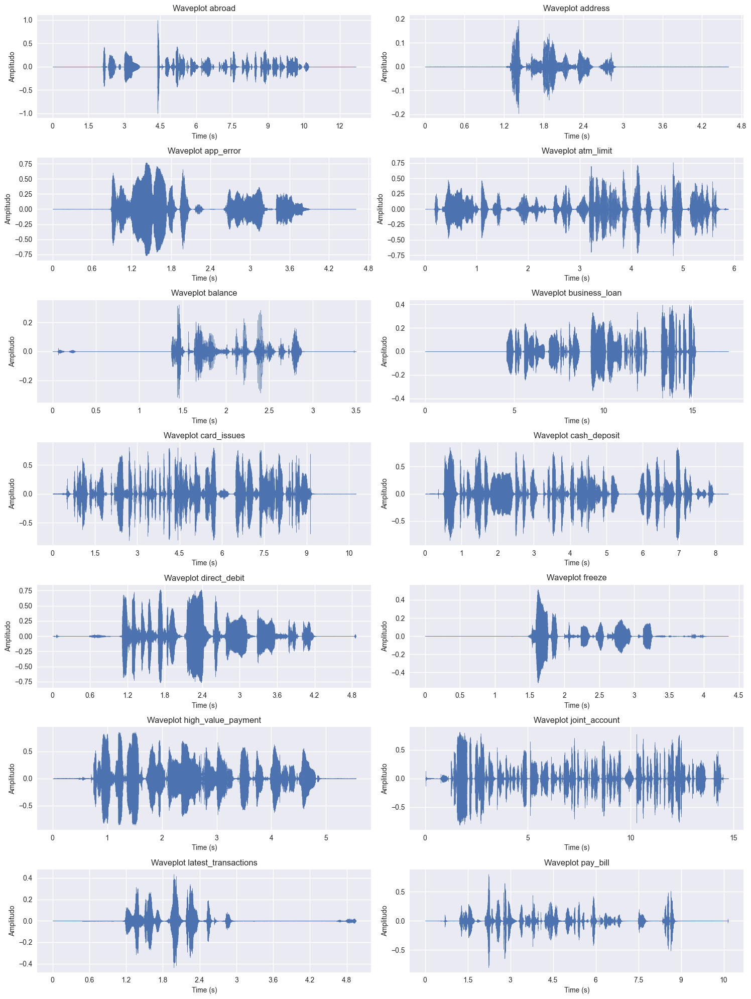

In [32]:
# Buat subplots
fig, axes = plt.subplots(7, 2, figsize=(15, 20))

for i, (key, audio_info) in enumerate(selected_samples.items()):

    row_idx = i // 2
    col_idx = i % 2
    ax = axes[row_idx, col_idx]

    data, sampling_rate = librosa.load(audio_info['path'])

    librosa.display.waveshow(data, sr=sampling_rate, ax=ax)

    ax.set_title(f'Waveplot {class_mapping[key]}')
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Amplitudo')

# Sesuaikan tata letak
plt.tight_layout()
plt.show()

## Displays a Spectogram Diagram for each intent_class

### Hertz

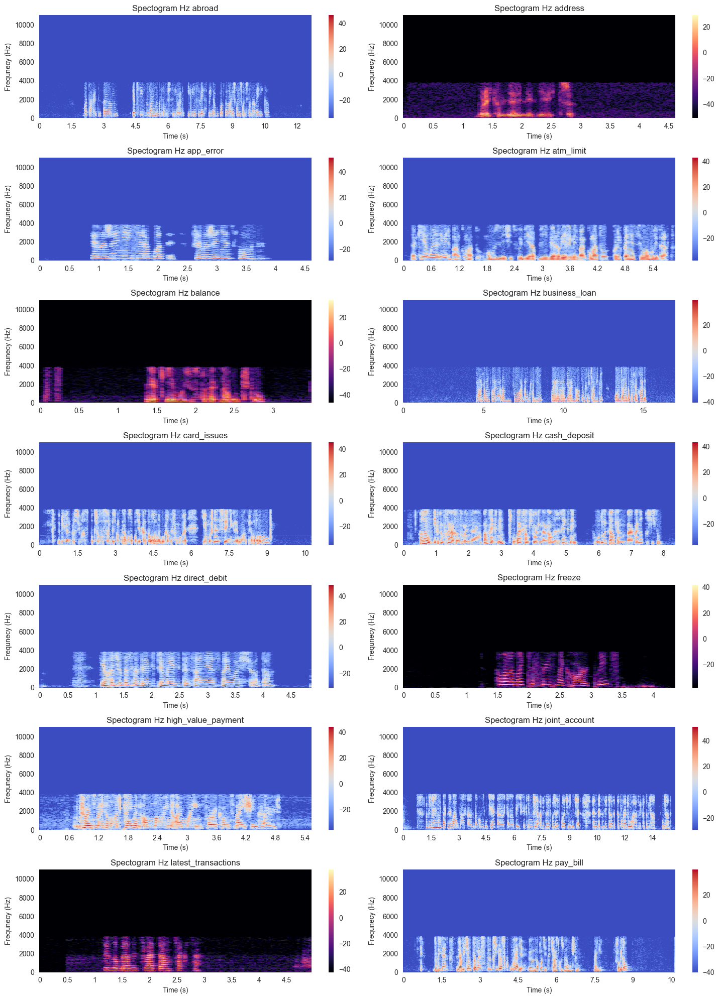

In [43]:
# Buat subplots
fig, axes = plt.subplots(7, 2, figsize=(15, 20))

for i, (key, audio_info) in enumerate(selected_samples.items()):
    
    row_idx = i // 2
    col_idx = i % 2
    ax = axes[row_idx, col_idx]
    
    data, sampling_rate = librosa.load(audio_info['path'])

    X = librosa.stft(data)
    Xdb = librosa.amplitude_to_db(abs(X))
    img = librosa.display.specshow(Xdb, sr=sampling_rate, x_axis='time', y_axis='hz', ax=ax)
    plt.colorbar(img, ax=ax)

    ax.set_title(f'Spectogram Hz {class_mapping[key]}')
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Frequnecy (Hz)')

# Sesuaikan tata letak
plt.tight_layout()
plt.show()


### Log

`log`: The spectrum is displayed on a logarithmic scale, where differences between small values are magnified, allowing more detail to be seen in the lower frequency regions.

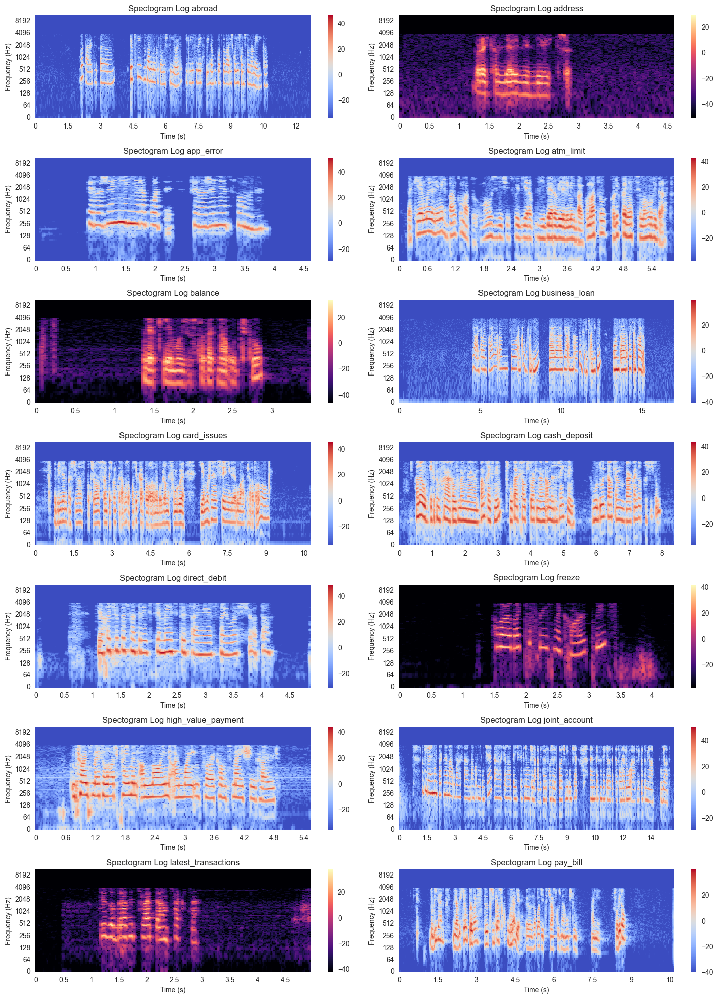

In [49]:
# Buat subplots
fig, axes = plt.subplots(7, 2, figsize=(15, 20))

for i, (key, audio_info) in enumerate(selected_samples.items()):
    
    row_idx = i // 2
    col_idx = i % 2
    ax = axes[row_idx, col_idx]
    
    data, sampling_rate = librosa.load(audio_info['path'])

    X = librosa.stft(data)
    Xdb = librosa.amplitude_to_db(abs(X))
    img = librosa.display.specshow(Xdb, sr=sampling_rate, x_axis='time', y_axis='log', ax=ax)
    plt.colorbar(img, ax=ax)

    ax.set_title(f'Spectogram Log {class_mapping[key]}')
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Frequency (Hz)')

# Sesuaikan tata letak
plt.tight_layout()

plt.show()


### Mel

`mel`: Frequency is determined by the Mel scale, which is adapted to the way human hearing perceives sounds. This helps present the spectrogram in a more intuitive manner in line with human auditory perception.

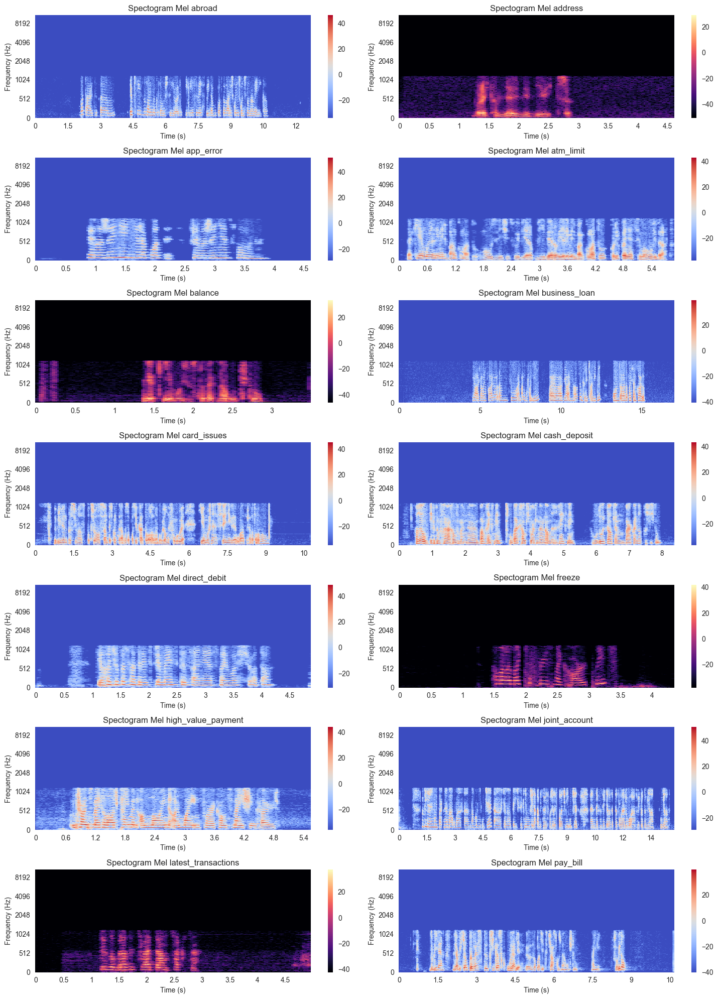

In [50]:
# Buat subplots
fig, axes = plt.subplots(7, 2, figsize=(15, 20))

for i, (key, audio_info) in enumerate(selected_samples.items()):
    
    row_idx = i // 2
    col_idx = i % 2
    ax = axes[row_idx, col_idx]
    
    data, sampling_rate = librosa.load(audio_info['path'])

    X = librosa.stft(data)
    Xdb = librosa.amplitude_to_db(abs(X))
    img = librosa.display.specshow(Xdb, sr=sampling_rate, x_axis='time', y_axis='mel', ax=ax)
    plt.colorbar(img, ax=ax)

    ax.set_title(f'Spectogram Mel {class_mapping[key]}')
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Frequency (Hz)')

# Sesuaikan tata letak
plt.tight_layout()

plt.show()


### FFT Note

`fft_note`: Spectrum is displayed in logarithmic scale with musical pitch notation. This is useful for seeing the frequencies that correspond to certain note values on a musical scale

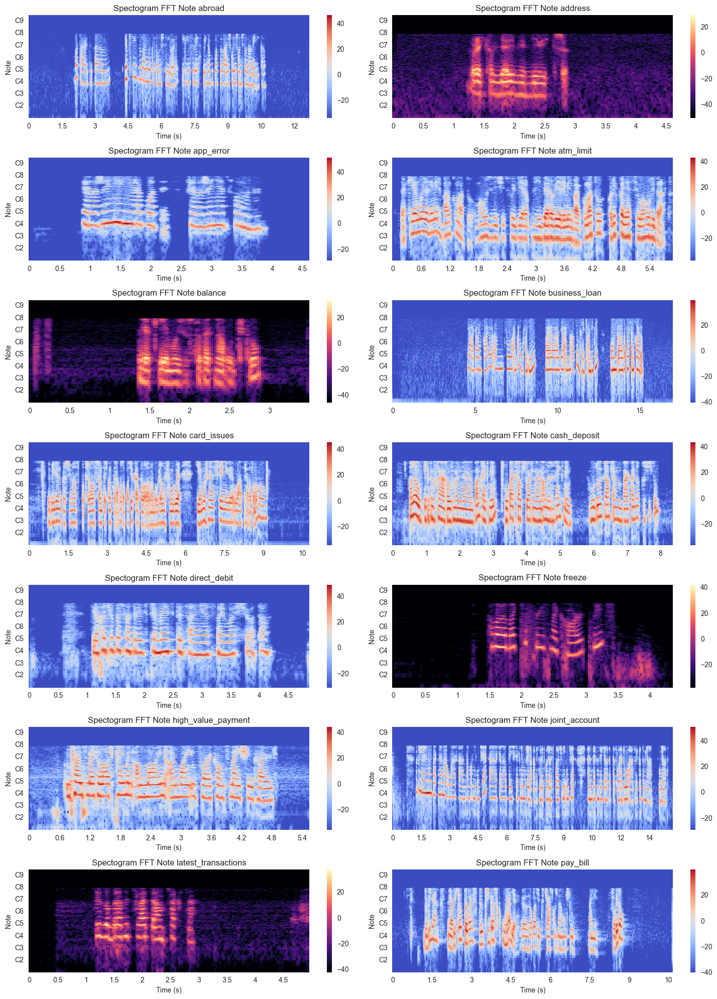

In [52]:
# Buat subplots
fig, axes = plt.subplots(7, 2, figsize=(15, 20))

for i, (key, audio_info) in enumerate(selected_samples.items()):
    
    row_idx = i // 2
    col_idx = i % 2
    ax = axes[row_idx, col_idx]
    
    data, sampling_rate = librosa.load(audio_info['path'])

    X = librosa.stft(data)
    Xdb = librosa.amplitude_to_db(abs(X))
    img = librosa.display.specshow(Xdb, sr=sampling_rate, x_axis='time', y_axis='fft_note', ax=ax)
    plt.colorbar(img, ax=ax)

    ax.set_title(f'Spectogram FFT Note {class_mapping[key]}')
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Note')

# Sesuaikan tata letak
plt.tight_layout()

plt.show()


# Display Spectral Centroid

The spectral centroid provides an idea of how far the frequency center of mass is located in the sound spectrum. The higher the spectral centroid, the more concentrated the frequencies are in the high part of the spectrum, which can be interpreted as a brighter or higher sound. Conversely, a lower spectral centroid may indicate a fainter or lower sound.

In [75]:
from sklearn import preprocessing

def normalize(x, axis=0):
    return preprocessing.minmax_scale(x, axis=axis)

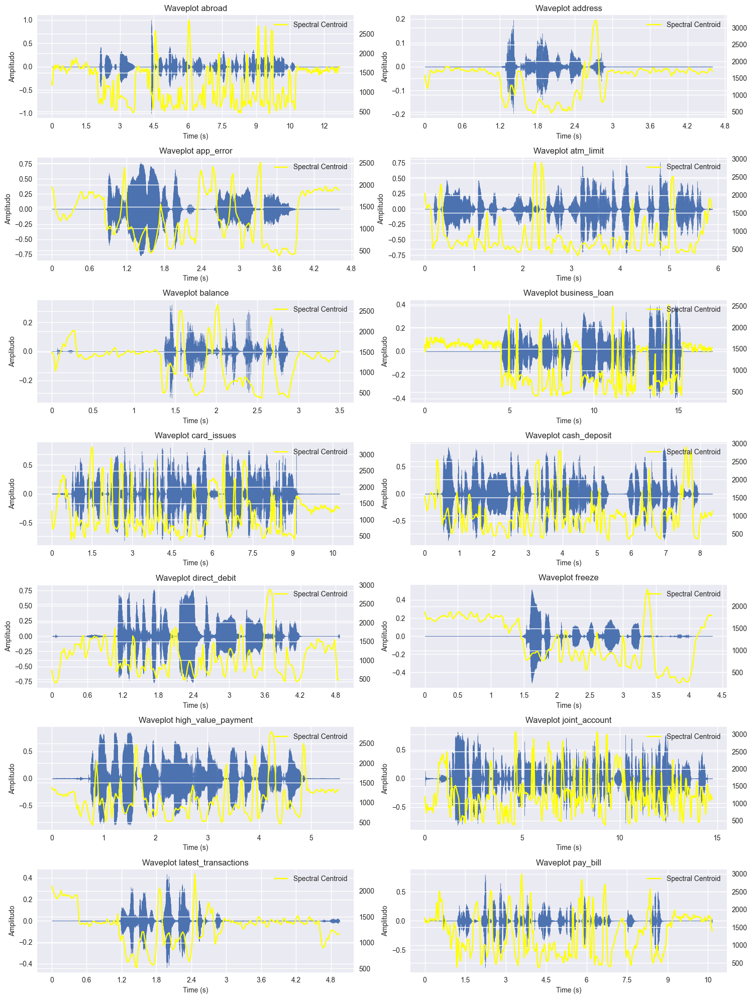

In [81]:


# Buat subplots
fig, axes = plt.subplots(7, 2, figsize=(15, 20))

for i, (key, audio_info) in enumerate(selected_samples.items()):

    row_idx = i // 2
    col_idx = i % 2
    ax = axes[row_idx, col_idx]

    # Memuat data audio
    data, sampling_rate = librosa.load(audio_info['path'])

    # Menambahkan waveplot
    librosa.display.waveshow(data, sr=sampling_rate, ax=ax)

    # Menambahkan spectral centroid
    spectral_centroids = librosa.feature.spectral_centroid(y=data, sr=sampling_rate)[0]

    frames = range(len(spectral_centroids))
    t = librosa.frames_to_time(frames)

    ax_twin = ax.twinx()
    ax_twin.plot(t, spectral_centroids, color='yellow', label='Spectral Centroid')
    ax_twin.legend(loc='upper right', fontsize=10, facecolor='gray')

    ax.set_title(f'Waveplot {class_mapping[key]}')
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Amplitudo')

# Sesuaikan tata letak
plt.tight_layout()
plt.show()


## Hertz

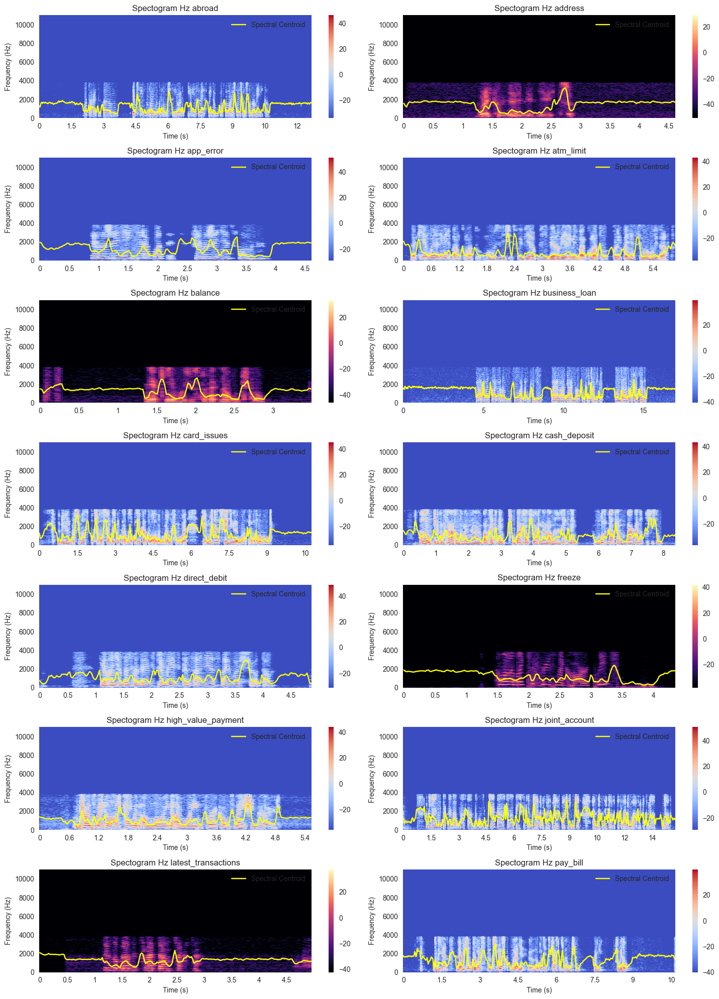

In [59]:
# Buat subplots
fig, axes = plt.subplots(7, 2, figsize=(15, 20))

for i, (key, audio_info) in enumerate(selected_samples.items()):
    
    row_idx = i // 2
    col_idx = i % 2
    ax = axes[row_idx, col_idx]
    
    data, sampling_rate = librosa.load(audio_info['path'])

    X = librosa.stft(data)
    Xdb = librosa.amplitude_to_db(abs(X))
    img = librosa.display.specshow(Xdb, sr=sampling_rate, x_axis='time', y_axis='hz', ax=ax)
    plt.colorbar(img, ax=ax)

    ax.set_title(f'Spectogram Hz {class_mapping[key]}')
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Frequency (Hz)')

    # Tambahkan plot Spectral Centroid
    spectral_centroids = librosa.feature.spectral_centroid(y=data, sr=sampling_rate)[0]
    frames = range(len(spectral_centroids))
    t = librosa.frames_to_time(frames)
    ax.plot(t, spectral_centroids, color='yellow', label='Spectral Centroid')
    ax.legend(loc='upper right', fontsize=10, facecolor='white')

# Sesuaikan tata letak
plt.tight_layout()

plt.show()


## Log

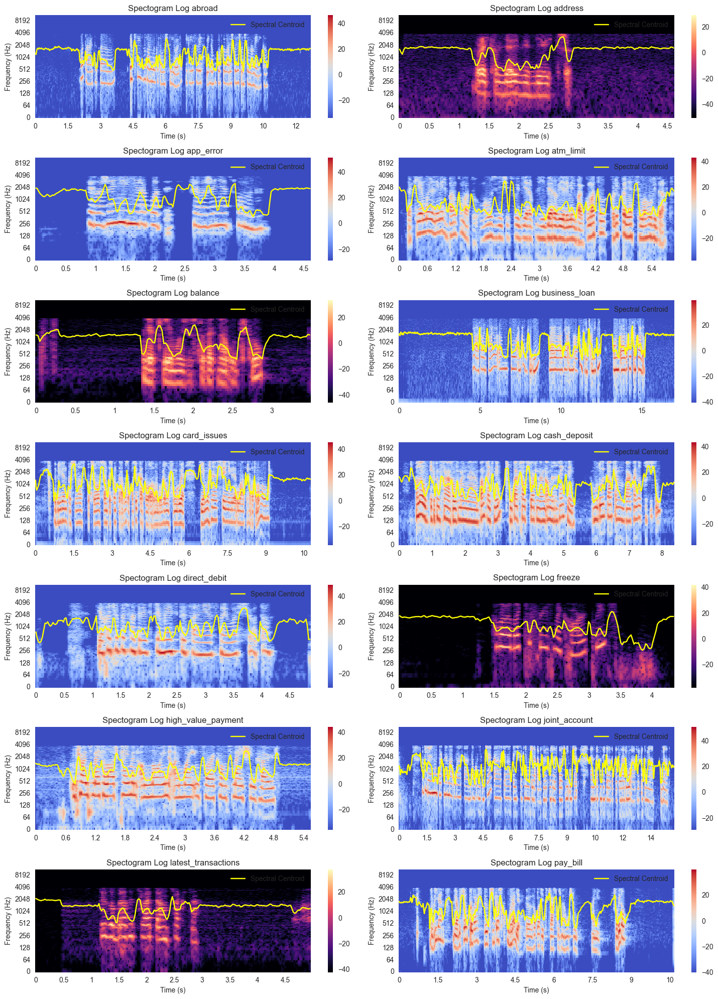

In [60]:
# Buat subplots
fig, axes = plt.subplots(7, 2, figsize=(15, 20))

for i, (key, audio_info) in enumerate(selected_samples.items()):
    
    row_idx = i // 2
    col_idx = i % 2
    ax = axes[row_idx, col_idx]
    
    data, sampling_rate = librosa.load(audio_info['path'])

    X = librosa.stft(data)
    Xdb = librosa.amplitude_to_db(abs(X))
    img = librosa.display.specshow(Xdb, sr=sampling_rate, x_axis='time', y_axis='log', ax=ax)
    plt.colorbar(img, ax=ax)

    ax.set_title(f'Spectogram Log {class_mapping[key]}')
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Frequency (Hz)')

    # Tambahkan plot Spectral Centroid
    spectral_centroids = librosa.feature.spectral_centroid(y=data, sr=sampling_rate)[0]
    frames = range(len(spectral_centroids))
    t = librosa.frames_to_time(frames)
    ax.plot(t, spectral_centroids, color='yellow', label='Spectral Centroid')
    ax.legend(loc='upper right', fontsize=10, facecolor='white')

# Sesuaikan tata letak
plt.tight_layout()

plt.show()


# Display Spectral Roll-off

Intuitively, the spectral roll-off point indicates the frequency boundary where most of the frequency energy in the signal resides.

## Hertz

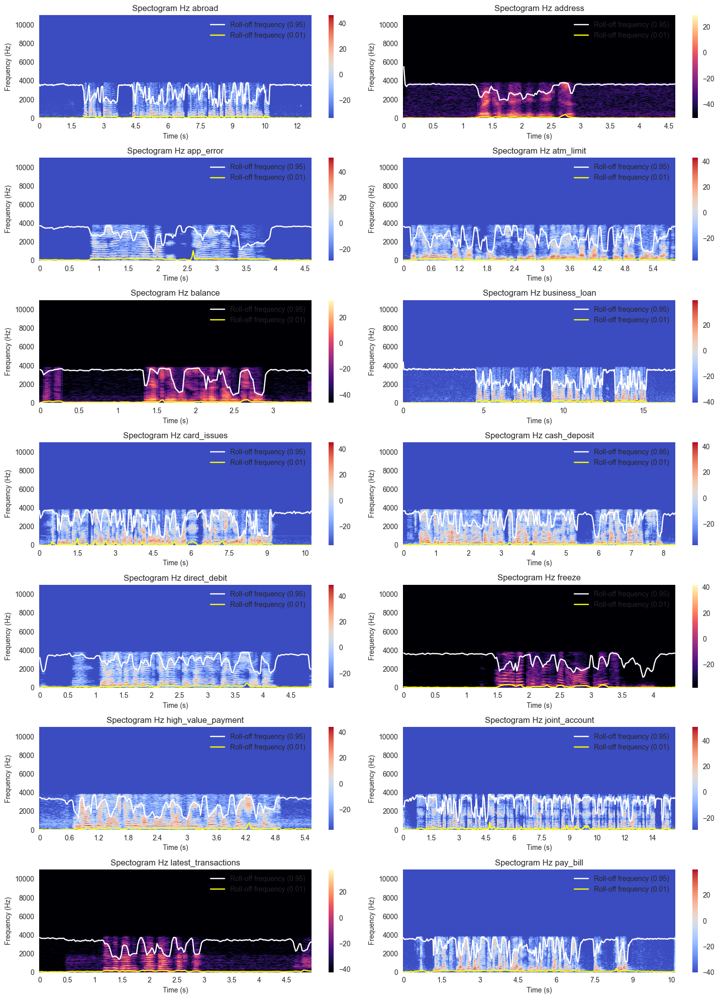

In [61]:
# Buat subplots
fig, axes = plt.subplots(7, 2, figsize=(15, 20))

for i, (key, audio_info) in enumerate(selected_samples.items()):
    
    row_idx = i // 2
    col_idx = i % 2
    ax = axes[row_idx, col_idx]
    
    data, sampling_rate = librosa.load(audio_info['path'])

    X = librosa.stft(data)
    Xdb = librosa.amplitude_to_db(abs(X))
    img = librosa.display.specshow(Xdb, sr=sampling_rate, x_axis='time', y_axis='hz', ax=ax)
    plt.colorbar(img, ax=ax)

    ax.set_title(f'Spectogram Hz {class_mapping[key]}')
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Frequency (Hz)')

    # Tambahkan plot Spectral Centroid
    spectral_centroids = librosa.feature.spectral_centroid(y=data, sr=sampling_rate)[0]

    spectral_rolloff_up = librosa.feature.spectral_rolloff(y=data, sr=sampling_rate, roll_percent=0.95)[0]
    spectral_rolloff_down = librosa.feature.spectral_rolloff(y=data, sr=sampling_rate, roll_percent=0.01)[0]

    frames = range(len(spectral_centroids))
    t = librosa.frames_to_time(frames)

    ax.plot(t, spectral_rolloff_up, color='white', label='Roll-off frequency (0.95)')
    ax.plot(t, spectral_rolloff_down, color='yellow', label='Roll-off frequency (0.01)')
    ax.legend(loc='upper right', fontsize=10, facecolor='gray')

# Sesuaikan tata letak
plt.tight_layout()

plt.show()


## Log

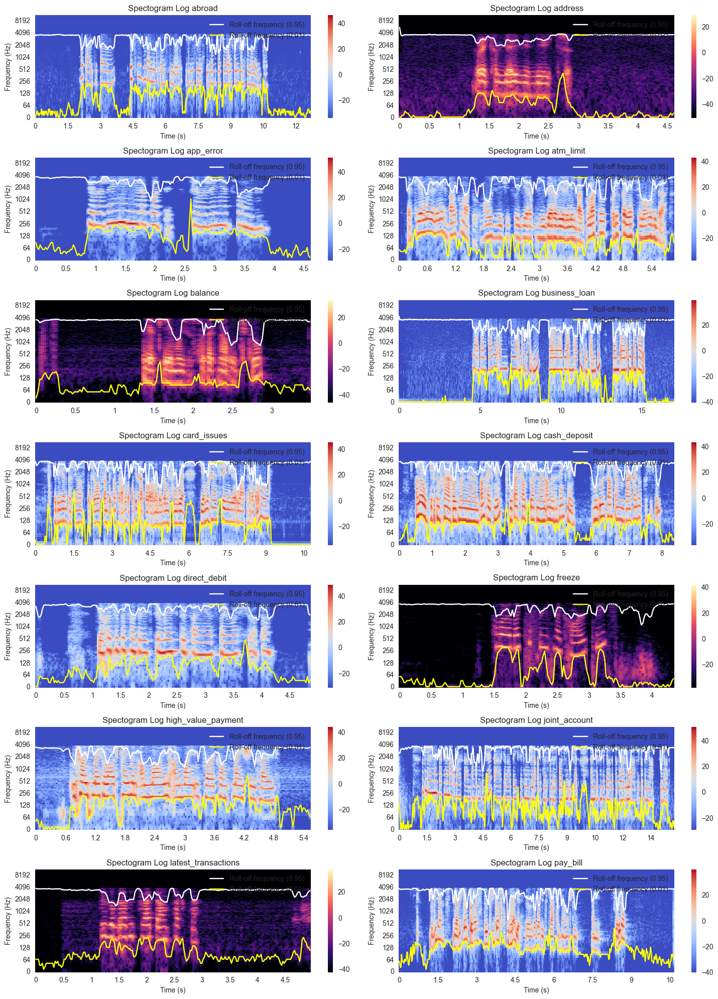

In [62]:
# Buat subplots
fig, axes = plt.subplots(7, 2, figsize=(15, 20))

for i, (key, audio_info) in enumerate(selected_samples.items()):
    
    row_idx = i // 2
    col_idx = i % 2
    ax = axes[row_idx, col_idx]
    
    data, sampling_rate = librosa.load(audio_info['path'])

    X = librosa.stft(data)
    Xdb = librosa.amplitude_to_db(abs(X))
    img = librosa.display.specshow(Xdb, sr=sampling_rate, x_axis='time', y_axis='log', ax=ax)
    plt.colorbar(img, ax=ax)

    ax.set_title(f'Spectogram Log {class_mapping[key]}')
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Frequency (Hz)')

    # Tambahkan plot Spectral Centroid
    spectral_centroids = librosa.feature.spectral_centroid(y=data, sr=sampling_rate)[0]

    spectral_rolloff_up = librosa.feature.spectral_rolloff(y=data, sr=sampling_rate, roll_percent=0.95)[0]
    spectral_rolloff_down = librosa.feature.spectral_rolloff(y=data, sr=sampling_rate, roll_percent=0.01)[0]

    frames = range(len(spectral_centroids))
    t = librosa.frames_to_time(frames)

    ax.plot(t, spectral_rolloff_up, color='white', label='Roll-off frequency (0.95)')
    ax.plot(t, spectral_rolloff_down, color='yellow', label='Roll-off frequency (0.01)')
    ax.legend(loc='upper right', fontsize=10, facecolor='gray')

# Sesuaikan tata letak
plt.tight_layout()

plt.show()


# Display MFCC

MFCCs can be thought of as “boxes” or “bins” in the histogram. Each MFCC represents the contribution of frequencies in a certain range to a time frame. In other words, MFCCs describe how much energy or frequency information is present in that time frame.

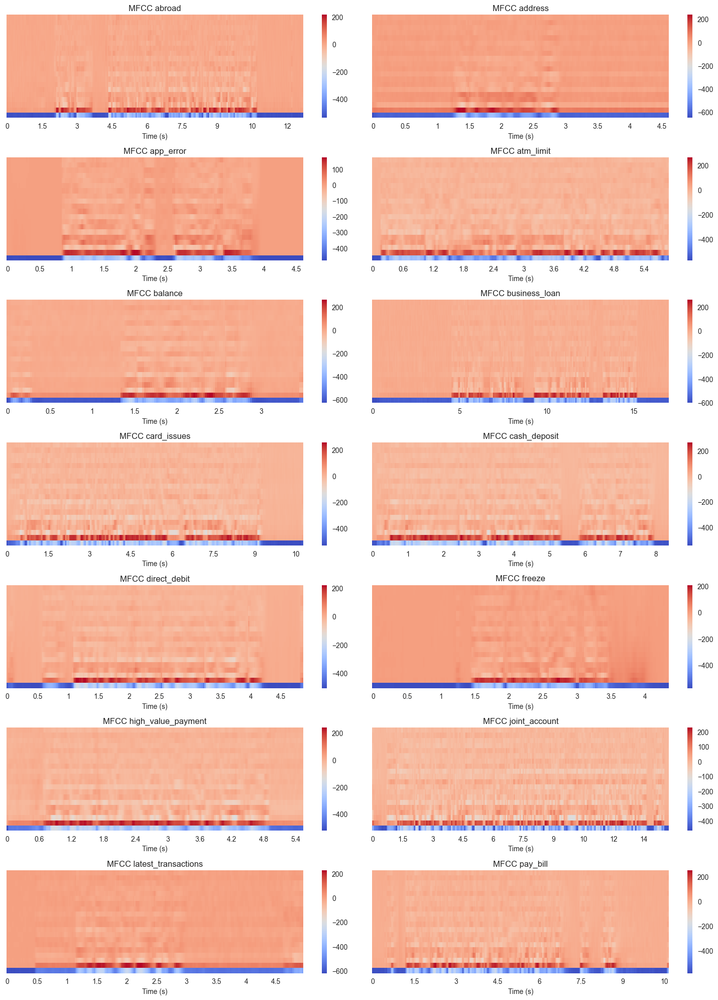

In [64]:
# Buat subplots
fig, axes = plt.subplots(7, 2, figsize=(15, 20))

for i, (key, audio_info) in enumerate(selected_samples.items()):

    row_idx = i // 2
    col_idx = i % 2
    ax = axes[row_idx, col_idx]

    data, sampling_rate = librosa.load(audio_info['path'])

    mfccs = librosa.feature.mfcc(y=data, sr=sampling_rate)

    img = librosa.display.specshow(mfccs, sr=sampling_rate, x_axis='time', ax=ax)
    plt.colorbar(img, ax=ax)

    ax.set_title(f'MFCC {class_mapping[key]}')
    ax.set_xlabel('Time (s)')

# Sesuaikan tata letak
plt.tight_layout()
plt.show()

# Display Chroma

Chroma describes the distribution of frequency energy within a class of tones or musical notes. It provides information about the tonality and harmony of sounds.

Chroma is usually calculated as a feature vector with 12 elements, representing 12 note classes (7 major notes + 5 sharp notes).

## Chroma STFT

STFT Chroma helps describe how much energy each class of notes contains in a musical context. This is useful for assessing how similar two pieces of music are or for supporting automatic speech recognition systems.

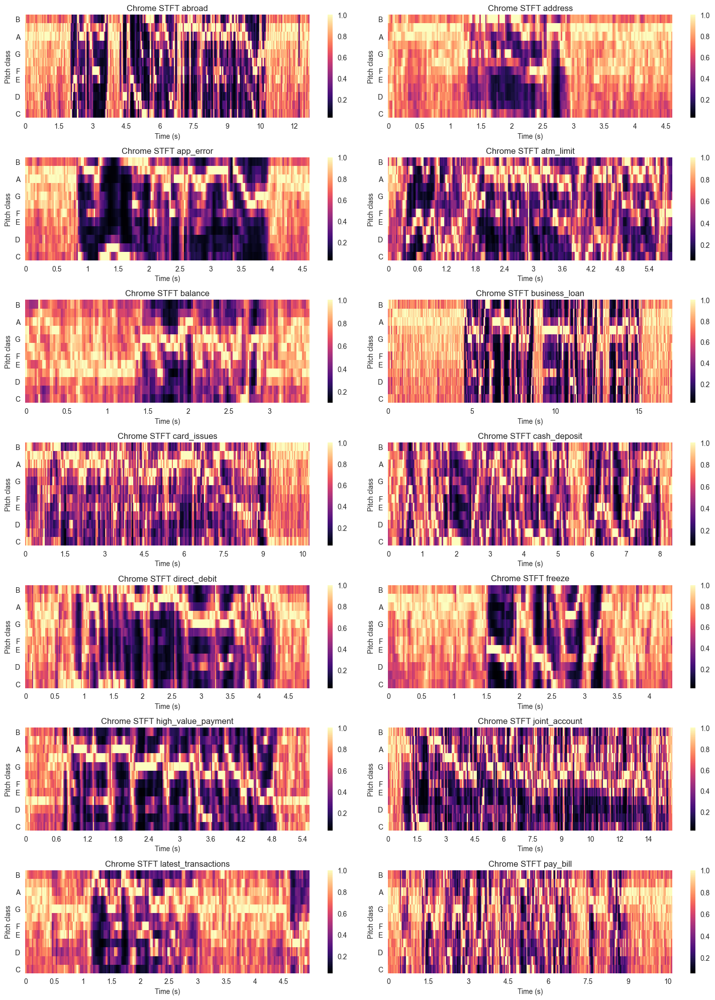

In [65]:
# Buat subplots
fig, axes = plt.subplots(7, 2, figsize=(15, 20))

for i, (key, audio_info) in enumerate(selected_samples.items()):

    row_idx = i // 2
    col_idx = i % 2
    ax = axes[row_idx, col_idx]

    data, sampling_rate = librosa.load(audio_info['path'])

    signal = np.abs(librosa.stft(data))
    chroma_stft = librosa.feature.chroma_stft(S=signal, sr=sampling_rate)

    img = librosa.display.specshow(chroma_stft, sr=sampling_rate, x_axis='time', y_axis='chroma', ax=ax)
    plt.colorbar(img, ax=ax)

    ax.set_title(f'Chrome STFT {class_mapping[key]}')
    ax.set_xlabel('Time (s)')

# Sesuaikan tata letak
plt.tight_layout()
plt.show()

## Chroma CQT

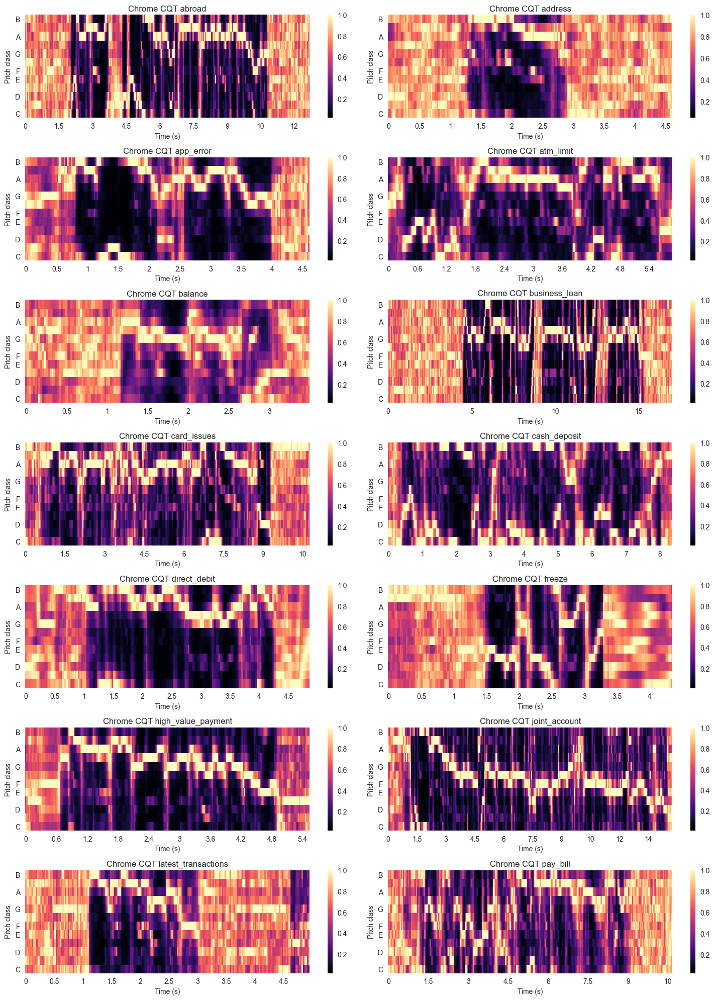

In [66]:
# Buat subplots
fig, axes = plt.subplots(7, 2, figsize=(15, 20))

for i, (key, audio_info) in enumerate(selected_samples.items()):

    row_idx = i // 2
    col_idx = i % 2
    ax = axes[row_idx, col_idx]

    data, sampling_rate = librosa.load(audio_info['path'])

    # signal = np.abs(librosa.stft(data))
    chroma_cqt = librosa.feature.chroma_cqt(y=data, sr=sampling_rate)

    img = librosa.display.specshow(chroma_cqt, sr=sampling_rate, x_axis='time', y_axis='chroma', ax=ax)
    plt.colorbar(img, ax=ax)

    ax.set_title(f'Chrome CQT {class_mapping[key]}')
    ax.set_xlabel('Time (s)')

# Sesuaikan tata letak
plt.tight_layout()
plt.show()

## Chroma CENS

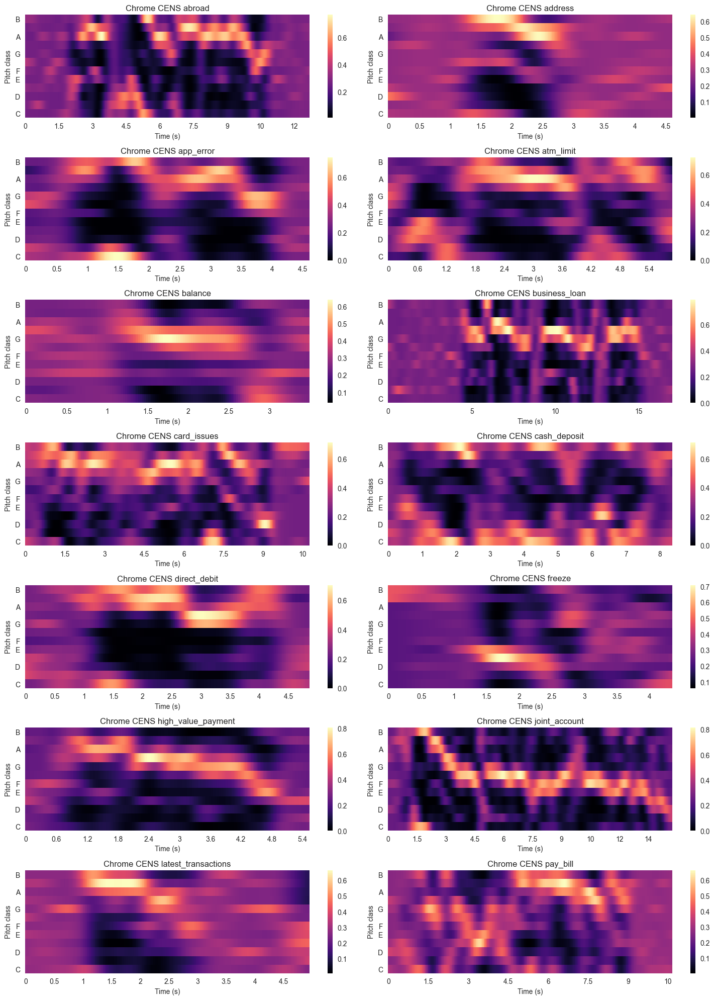

In [68]:
# Buat subplots
fig, axes = plt.subplots(7, 2, figsize=(15, 20))

for i, (key, audio_info) in enumerate(selected_samples.items()):

    row_idx = i // 2
    col_idx = i % 2
    ax = axes[row_idx, col_idx]

    data, sampling_rate = librosa.load(audio_info['path'])

    # signal = np.abs(librosa.stft(data))
    chroma_cens = librosa.feature.chroma_cens(y=data, sr=sampling_rate)

    img = librosa.display.specshow(chroma_cens, sr=sampling_rate, x_axis='time', y_axis='chroma', ax=ax)
    plt.colorbar(img, ax=ax)

    ax.set_title(f'Chrome CENS {class_mapping[key]}')
    ax.set_xlabel('Time (s)')

# Sesuaikan tata letak
plt.tight_layout()
plt.show()